In [1]:
%autosave 10

Autosaving every 10 seconds


# Importing dependencies

In [2]:
import pandas as pd       
import matplotlib as mat
import matplotlib.pyplot as plt    
import numpy as np
import seaborn as sns
%matplotlib inline
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
import scipy.stats as stats
from sklearn.preprocessing import PowerTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,precision_score,f1_score,recall_score
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier

In [3]:
df=pd.read_csv("UCI_Credit_Card.csv")

In [4]:
df.sample(5)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
19962,19963,260000.0,2,1,1,42,0,0,-1,-1,...,12996.0,8788.0,15104.0,1500.0,3856.0,13000.0,0.0,15104.0,16764.0,0
22388,22389,360000.0,2,2,2,31,0,-1,-1,-1,...,1650.0,4350.0,4792.0,5964.0,1340.0,1650.0,4350.0,4792.0,40682.0,0
19812,19813,290000.0,2,2,2,41,-1,0,0,0,...,17105.0,18875.0,21304.0,2500.0,13500.0,3000.0,3000.0,3000.0,2000.0,0
2463,2464,20000.0,1,2,2,27,1,3,2,2,...,18648.0,20040.0,19464.0,0.0,1000.0,0.0,2000.0,0.0,817.0,1
22732,22733,500000.0,2,2,1,38,0,0,0,0,...,27854.0,30961.0,54017.0,7000.0,7000.0,2000.0,5000.0,25002.0,3000.0,0


# EDA

In [5]:
df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


Dataset Information
This dataset contains information on default payments, demographic factors, credit data, history of payment, and bill statements of credit card clients in Taiwan from April 2005 to September 2005.

Content
There are 25 variables:


    ID: ID of each client
    LIMIT_BAL: Amount of given credit in NT dollars (includes individual and family/supplementary = credit)
    SEX: Gender (1=male, 2=female)
    EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
    MARRIAGE: Marital status (1=married, 2=single, 3=others)
    AGE: Age in years
    PAY_0: Repayment status in September, 2005 (-1=pay duly, 1=payment delay for one month, 2=payment delay for two months, … 8=payment delay for eight months, 9=payment delay for nine months and above)
    PAY_2: Repayment status in August, 2005 (scale same as above)
    PAY_3: Repayment status in July, 2005 (scale same as above)
    PAY_4: Repayment status in June, 2005 (scale same as above)
    PAY_5: Repayment status in May, 2005 (scale same as above)
    PAY_6: Repayment status in April, 2005 (scale same as above)
    BILL_AMT1: Amount of bill statement in September, 2005 (NT dollar)
    BILL_AMT2: Amount of bill statement in August, 2005 (NT dollar)
    BILL_AMT3: Amount of bill statement in July, 2005 (NT dollar)
    BILL_AMT4: Amount of bill statement in June, 2005 (NT dollar)
    BILL_AMT5: Amount of bill statement in May, 2005 (NT dollar)
    BILL_AMT6: Amount of bill statement in April, 2005 (NT dollar)
    PAY_AMT1: Amount of previous payment in September, 2005 (NT dollar)
    PAY_AMT2: Amount of previous payment in August, 2005 (NT dollar)
    PAY_AMT3: Amount of previous payment in July, 2005 (NT dollar)
    PAY_AMT4: Amount of previous payment in June, 2005 (NT dollar)
    PAY_AMT5: Amount of previous payment in May, 2005 (NT dollar)
    PAY_AMT6: Amount of previous payment in April, 2005 (NT dollar)
    default.payment.next.month: Default payment (1=yes, 0=no)

In [6]:
df.rename(columns={"PAY_0":"PAY_1","default.payment.next.month":"Default"},inplace=True)

In [7]:
df

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Default
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000.0,1,3,1,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,29997,150000.0,1,3,2,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,29998,30000.0,1,2,2,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,29999,80000.0,1,3,1,41,1,-1,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


# SEX

In [8]:
df['SEX'].value_counts()

2    18112
1    11888
Name: SEX, dtype: int64

In [9]:
df["Default"].groupby(by=df["SEX"]).value_counts(normalize=True)

SEX  Default
1    0          0.758328
     1          0.241672
2    0          0.792237
     1          0.207763
Name: Default, dtype: float64

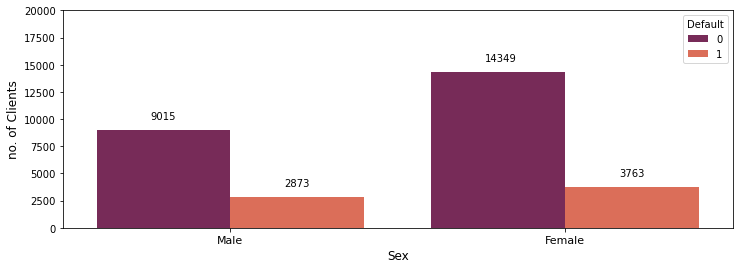

In [10]:
plt.figure(figsize=(12,4))
ax = sns.countplot(data = df, x = 'SEX', hue="Default", palette = 'rocket')

plt.xlabel("Sex", fontsize= 12)
plt.ylabel("no. of Clients", fontsize= 12)
plt.ylim(0,20000)
plt.xticks([0,1],['Male', 'Female'], fontsize = 11)

for p in ax.patches:
    ax.annotate((p.get_height()), (p.get_x()+0.16, p.get_height()+1000))

plt.show()


Percentage of male being default is 

In [11]:
(2873/(9015+2873))*100

24.16722745625841

Percentage of female being default is

In [12]:
(3763/(14349+3763))*100

20.776280918727917

There are more women than men in our dataset and, apparently, men have a slightly higher chance of default.

# EDUCATION

In [13]:
df["EDUCATION"].value_counts()

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64

In [14]:
df["EDUCATION"]=df["EDUCATION"].replace(0,5)
df["EDUCATION"]=df["EDUCATION"].replace(6,5)
df["EDUCATION"]=df["EDUCATION"].replace(5,4)

In [15]:
df["EDUCATION"].value_counts()

2    14030
1    10585
3     4917
4      468
Name: EDUCATION, dtype: int64

In [16]:
df["Default"].groupby(by=df["EDUCATION"]).value_counts(normalize=True)

EDUCATION  Default
1          0          0.807652
           1          0.192348
2          0          0.762651
           1          0.237349
3          0          0.748424
           1          0.251576
4          0          0.929487
           1          0.070513
Name: Default, dtype: float64

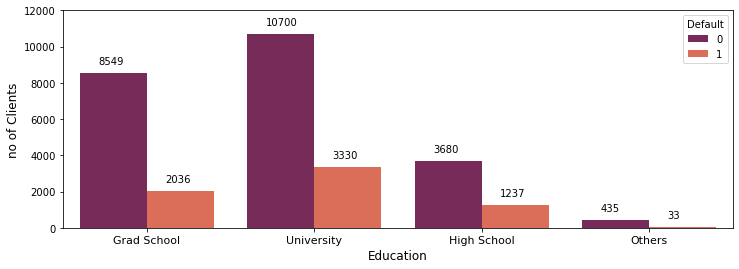

In [17]:
plt.figure(figsize=(12,4))

ax = sns.countplot(data = df, x = 'EDUCATION', hue="Default", palette = 'rocket')

plt.xlabel("Education", fontsize= 12)
plt.ylabel("no of Clients", fontsize= 12)
plt.ylim(0,12000)
plt.xticks([0,1,2,3],['Grad School','University','High School','Others'], fontsize = 11)

for p in ax.patches:
    ax.annotate((p.get_height()), (p.get_x()+0.11, p.get_height()+500))

plt.show()

# MARITAL STATUS

In [18]:
df['MARRIAGE'].value_counts()

2    15964
1    13659
3      323
0       54
Name: MARRIAGE, dtype: int64

In [19]:
df['Default'].groupby(df['MARRIAGE']).value_counts(normalize = True)

MARRIAGE  Default
0         0          0.907407
          1          0.092593
1         0          0.765283
          1          0.234717
2         0          0.790717
          1          0.209283
3         0          0.739938
          1          0.260062
Name: Default, dtype: float64

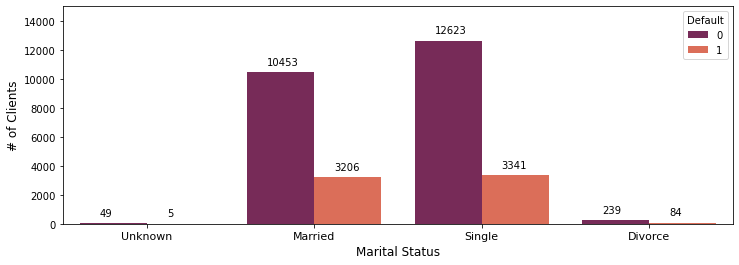

In [20]:
plt.figure(figsize=(12,4))

ax = sns.countplot(data = df, x = 'MARRIAGE', hue="Default", palette = 'rocket')

plt.xlabel("Marital Status", fontsize= 12)
plt.ylabel("# of Clients", fontsize= 12)
plt.ylim(0,15000)
plt.xticks([0,1,2,3],['Unknown', 'Married', 'Single', 'Divorce'], fontsize = 11)

for p in ax.patches:
    ax.annotate((p.get_height()), (p.get_x()+0.12, p.get_height()+500))

plt.show()

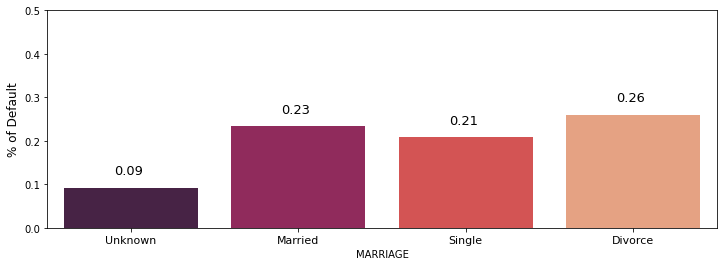

In [21]:
plt.figure(figsize=(12,4))

ax = sns.barplot(x = "MARRIAGE", y = "Default", data = df, palette = 'rocket', ci = None)

plt.ylabel("% of Default", fontsize= 12)
plt.ylim(0,0.5)
plt.xticks([0,1,2,3],['Unknown', 'Married', 'Single', 'Divorce'], fontsize = 11)

for p in ax.patches:
    ax.annotate("%.2f" %(p.get_height()), (p.get_x()+0.30, p.get_height()+0.03),fontsize=13)

plt.show()

As expected, most people fall either on the 'Married' or 'Single' category.

Once again, the 'Unknown' category present a lower probability of default. Among the rest, those who are single have a slight lower chance of default, while the people who got divorced are more likely to default.

# Checking distributions of numerical columns

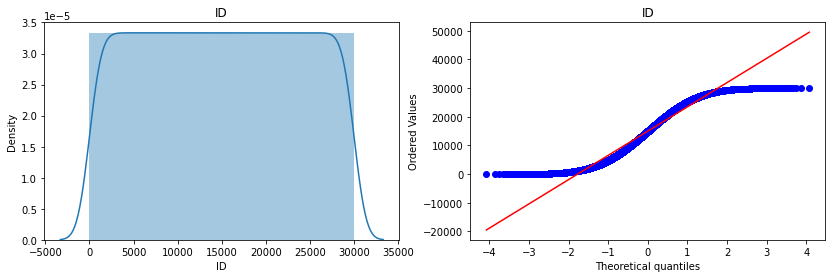

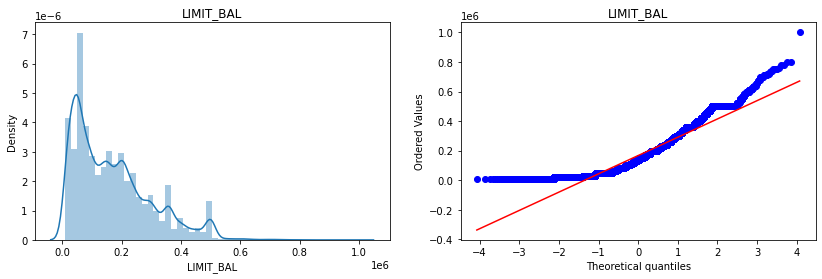

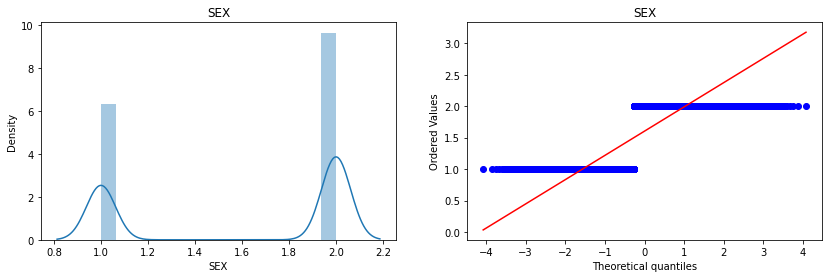

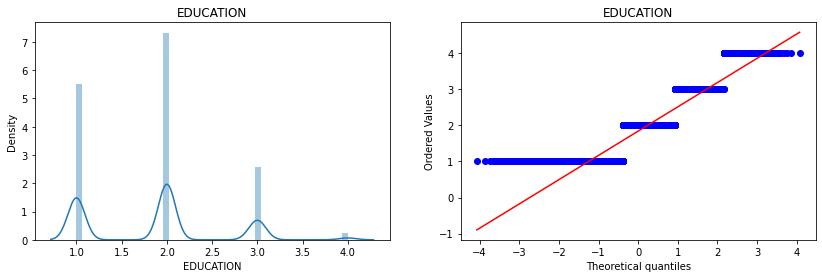

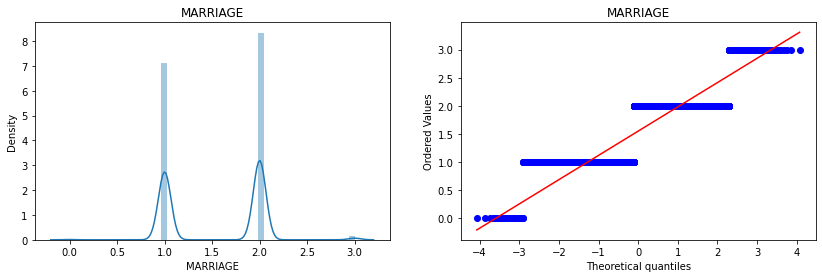

...

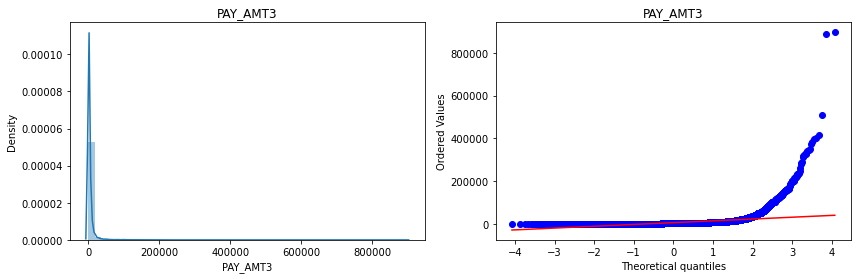

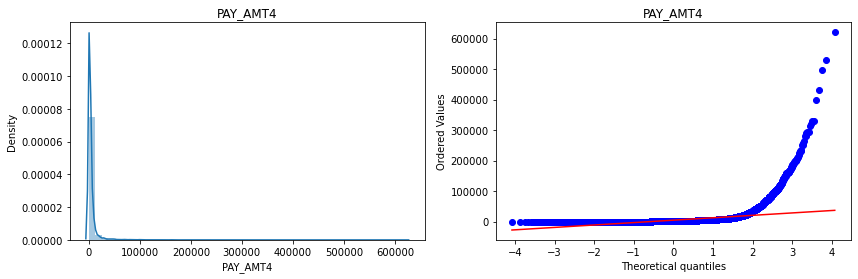

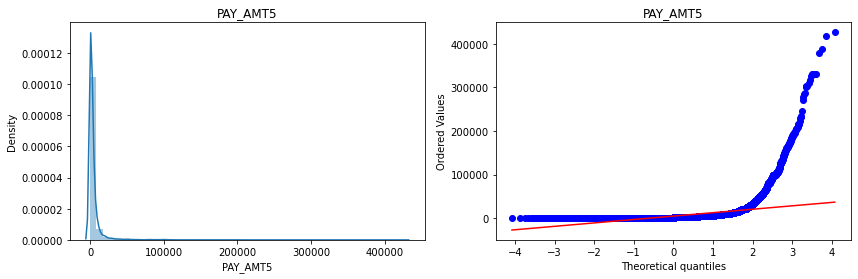

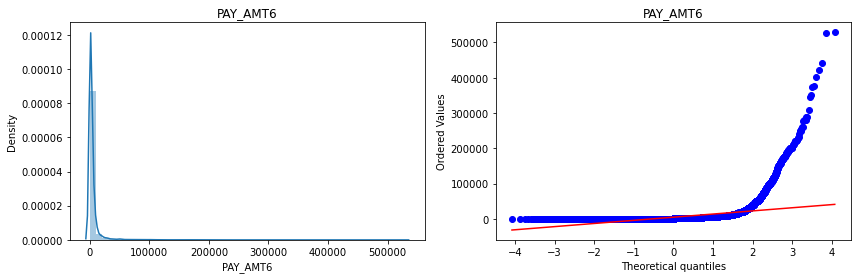

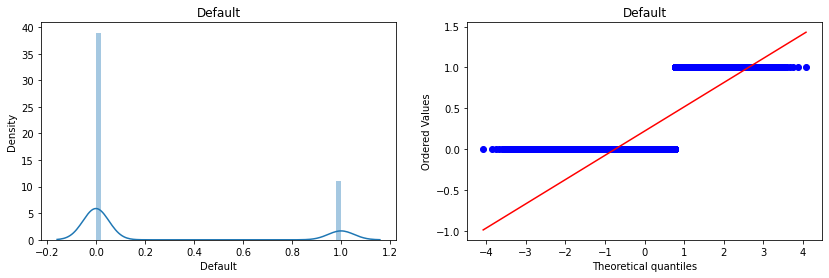

In [22]:
for col in df.columns:
    plt.figure(figsize=(14,4))
    plt.subplot(121)
    sns.distplot(df[col])
    plt.title(col)

    plt.subplot(122)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.title(col)

    plt.show()

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         30000 non-null  int64  
 1   LIMIT_BAL  30000 non-null  float64
 2   SEX        30000 non-null  int64  
 3   EDUCATION  30000 non-null  int64  
 4   MARRIAGE   30000 non-null  int64  
 5   AGE        30000 non-null  int64  
 6   PAY_1      30000 non-null  int64  
 7   PAY_2      30000 non-null  int64  
 8   PAY_3      30000 non-null  int64  
 9   PAY_4      30000 non-null  int64  
 10  PAY_5      30000 non-null  int64  
 11  PAY_6      30000 non-null  int64  
 12  BILL_AMT1  30000 non-null  float64
 13  BILL_AMT2  30000 non-null  float64
 14  BILL_AMT3  30000 non-null  float64
 15  BILL_AMT4  30000 non-null  float64
 16  BILL_AMT5  30000 non-null  float64
 17  BILL_AMT6  30000 non-null  float64
 18  PAY_AMT1   30000 non-null  float64
 19  PAY_AMT2   30000 non-null  float64
 20  PAY_AM

In [24]:
df_new=df.drop(columns=["ID","SEX","EDUCATION","MARRIAGE","PAY_1","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6","Default"])

In [25]:
df_new

,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,24,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,26,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,34,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,37,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,57,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,39,188948.0,192815.0,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0
29996,150000.0,43,1683.0,1828.0,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0
29997,30000.0,37,3565.0,3356.0,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0
29998,80000.0,41,-1645.0,78379.0,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0


In [26]:
df_new.columns

Index(['LIMIT_BAL', 'AGE', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

Doing a PowerTransformation with **YEO-JOHNSON** to make dataset normal like

In [27]:
pt = PowerTransformer(method='yeo-johnson', standardize=True)

df_new_transformed= pt.fit_transform(df_new)


pd.DataFrame({'cols':df_new.columns,'yeo_johnson_lambdas':pt.lambdas_})

,cols,yeo_johnson_lambdas
0,LIMIT_BAL,0.267350
1,AGE,-0.508937
2,BILL_AMT1,0.868866
3,BILL_AMT2,0.833375
4,BILL_AMT3,0.857684
5,BILL_AMT4,0.867096
6,BILL_AMT5,0.845608
7,BILL_AMT6,0.904544
8,PAY_AMT1,0.215702
9,PAY_AMT2,0.203440


In [28]:
df_new_transformed=pd.DataFrame(df_new_transformed,columns=df_new.columns)

In [29]:
df_new_transformed   #the new normalised data

,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,-1.665383,-1.505599,-0.654786,-0.666975,-0.703133,-0.708335,-0.705134,-0.656065,-1.724472,-0.347889,-1.629996,-1.578070,-1.556978,-1.515825
1,-0.090364,-1.134225,-0.679304,-0.700056,-0.655283,-0.624273,-0.604623,-0.580055,-1.724472,-0.202757,-0.080144,0.009080,-1.556978,0.332020
2,-0.396704,0.016042,-0.239392,-0.451718,-0.445706,-0.405640,-0.358103,-0.343748,-0.064485,-0.031718,-0.080144,0.009080,0.018806,0.741487
3,-0.953920,0.349978,0.017236,0.089416,0.119568,-0.161996,-0.098021,-0.097838,0.063555,0.102920,-0.006222,0.046787,0.044891,0.059121
4,-0.953920,1.862737,-0.568415,-0.611116,-0.082447,-0.287765,-0.277290,-0.279323,0.063555,1.948535,1.066641,1.057406,-0.121440,-0.080835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,0.637616,0.551292,1.802697,1.919256,2.182548,0.752282,-0.057869,-0.335927,0.875944,1.467718,0.668590,0.491133,0.739442,0.059121
29996,0.164019,0.911689,-0.700317,-0.697459,-0.637408,-0.506543,-0.563312,-0.656065,0.023264,0.378656,1.002584,-0.666948,-1.556978,-1.515825
29997,-1.371928,0.349978,-0.661598,-0.661177,-0.653596,-0.288845,-0.250303,-0.275300,-1.724472,-1.705383,1.587034,0.648057,0.304945,0.520536
29998,-0.515484,0.737966,-0.963596,0.509308,0.503502,0.229141,-0.419894,0.225154,2.836778,0.361063,-0.013840,0.281386,2.230110,0.289507


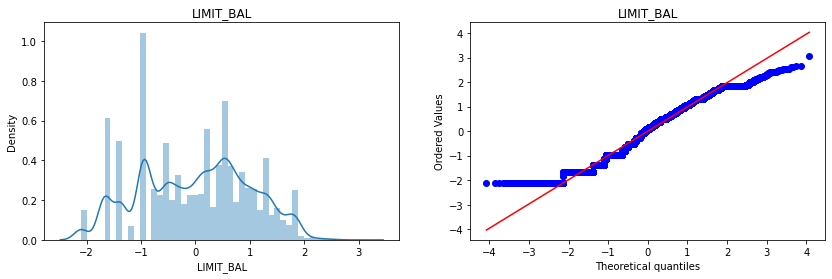

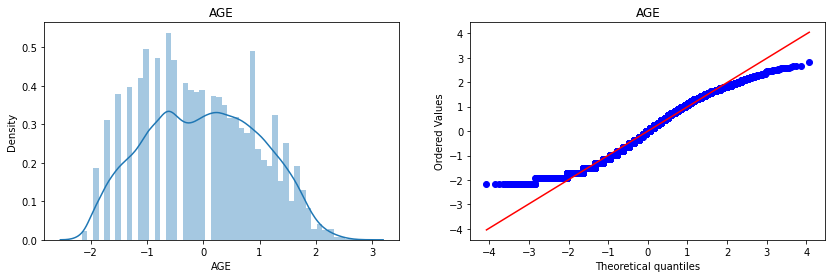

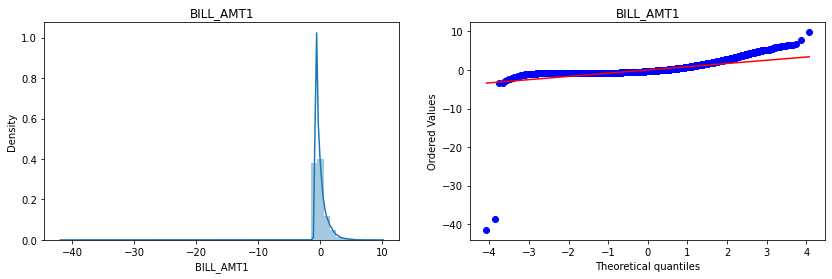

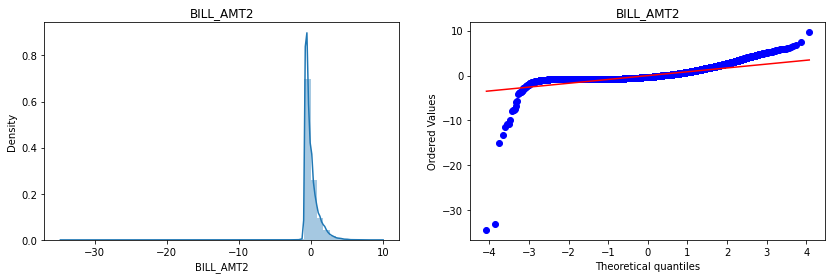

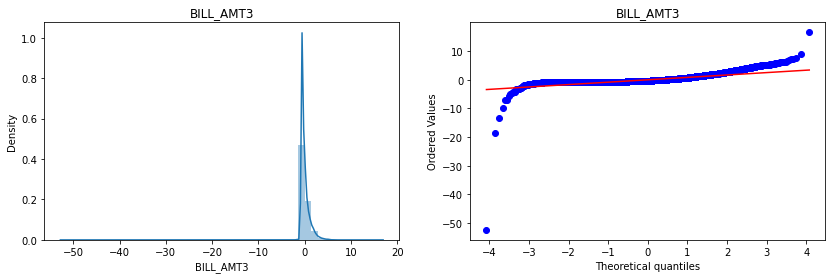

...

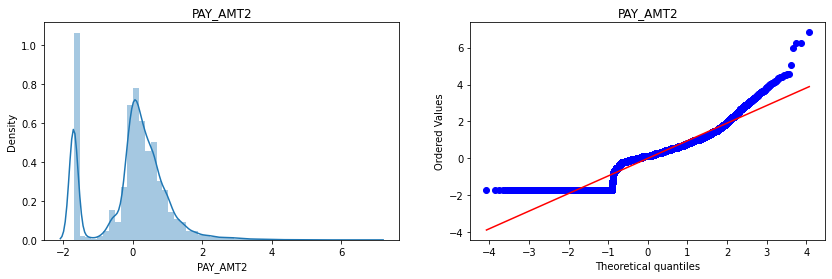

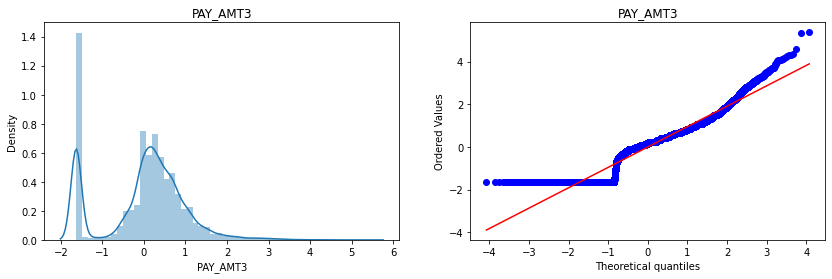

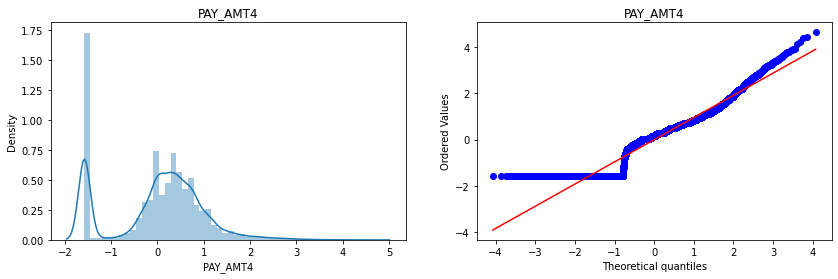

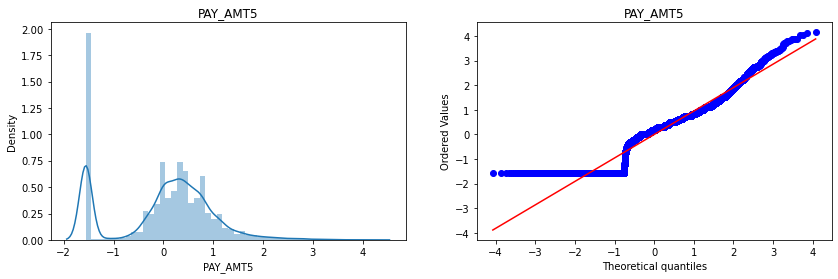

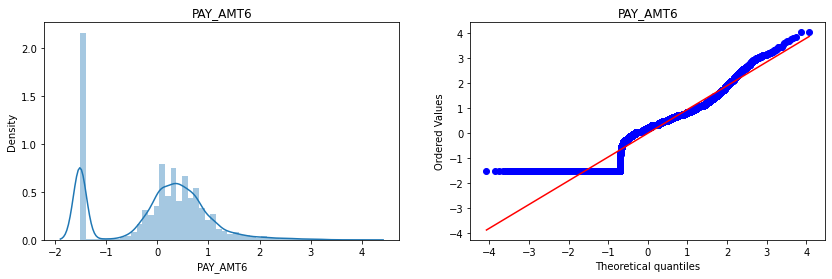

In [30]:
for col in df_new_transformed.columns:
    plt.figure(figsize=(14,4))
    plt.subplot(121)
    sns.distplot(df_new_transformed[col])
    plt.title(col)

    plt.subplot(122)
    stats.probplot(df_new_transformed[col], dist="norm", plot=plt)
    plt.title(col)

    plt.show()

In [31]:
df=df[["ID","SEX","EDUCATION","MARRIAGE","PAY_1","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6","Default"]]

In [32]:
df

,ID,SEX,EDUCATION,MARRIAGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Default
0,1,2,2,1,2,2,-1,-1,-2,-2,1
1,2,2,2,2,-1,2,0,0,0,2,1
2,3,2,2,2,0,0,0,0,0,0,0
3,4,2,2,1,0,0,0,0,0,0,0
4,5,1,2,1,-1,0,-1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,1,3,1,0,0,0,0,0,0,0
29996,29997,1,3,2,-1,-1,-1,-1,0,0,0
29997,29998,1,2,2,4,3,2,-1,0,0,1
29998,29999,1,3,1,1,-1,0,0,0,-1,1


In [33]:
df=pd.concat([df,df_new_transformed],axis=1)

In [34]:
df

,ID,SEX,EDUCATION,MARRIAGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,1,2,2,1,2,2,-1,-1,-2,-2,...,-0.703133,-0.708335,-0.705134,-0.656065,-1.724472,-0.347889,-1.629996,-1.578070,-1.556978,-1.515825
1,2,2,2,2,-1,2,0,0,0,2,...,-0.655283,-0.624273,-0.604623,-0.580055,-1.724472,-0.202757,-0.080144,0.009080,-1.556978,0.332020
2,3,2,2,2,0,0,0,0,0,0,...,-0.445706,-0.405640,-0.358103,-0.343748,-0.064485,-0.031718,-0.080144,0.009080,0.018806,0.741487
3,4,2,2,1,0,0,0,0,0,0,...,0.119568,-0.161996,-0.098021,-0.097838,0.063555,0.102920,-0.006222,0.046787,0.044891,0.059121
4,5,1,2,1,-1,0,-1,0,0,0,...,-0.082447,-0.287765,-0.277290,-0.279323,0.063555,1.948535,1.066641,1.057406,-0.121440,-0.080835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,1,3,1,0,0,0,0,0,0,...,2.182548,0.752282,-0.057869,-0.335927,0.875944,1.467718,0.668590,0.491133,0.739442,0.059121
29996,29997,1,3,2,-1,-1,-1,-1,0,0,...,-0.637408,-0.506543,-0.563312,-0.656065,0.023264,0.378656,1.002584,-0.666948,-1.556978,-1.515825
29997,29998,1,2,2,4,3,2,-1,0,0,...,-0.653596,-0.288845,-0.250303,-0.275300,-1.724472,-1.705383,1.587034,0.648057,0.304945,0.520536
29998,29999,1,3,1,1,-1,0,0,0,-1,...,0.503502,0.229141,-0.419894,0.225154,2.836778,0.361063,-0.013840,0.281386,2.230110,0.289507


In [35]:
df.isnull().sum()

ID           0
SEX          0
EDUCATION    0
MARRIAGE     0
PAY_1        0
PAY_2        0
PAY_3        0
PAY_4        0
PAY_5        0
PAY_6        0
Default      0
LIMIT_BAL    0
AGE          0
BILL_AMT1    0
BILL_AMT2    0
BILL_AMT3    0
BILL_AMT4    0
BILL_AMT5    0
BILL_AMT6    0
PAY_AMT1     0
PAY_AMT2     0
PAY_AMT3     0
PAY_AMT4     0
PAY_AMT5     0
PAY_AMT6     0
dtype: int64

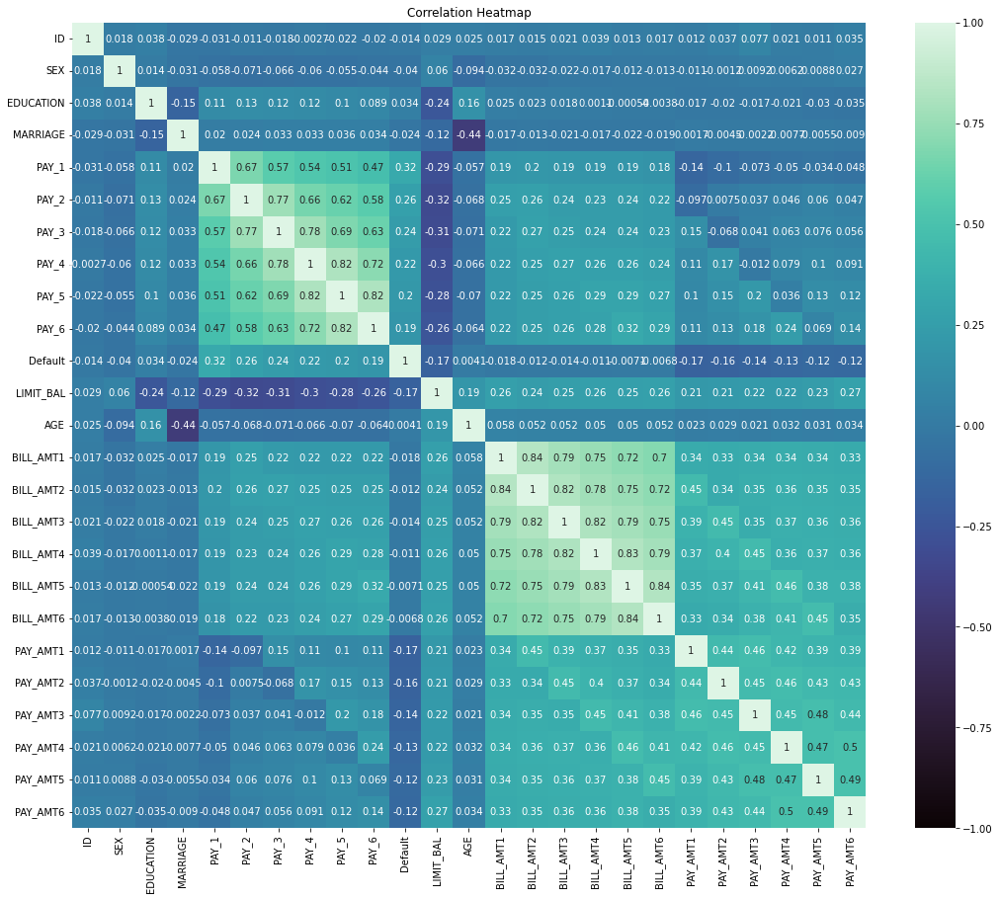

In [36]:
corr = df.corr()

plt.figure(figsize=(18, 15))
sns.heatmap(corr, annot=True, vmin=-1.0, cmap='mako')
plt.title("Correlation Heatmap")
plt.show()

In [37]:
df.head()

,ID,SEX,EDUCATION,MARRIAGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,1,2,2,1,2,2,-1,-1,-2,-2,...,-0.703133,-0.708335,-0.705134,-0.656065,-1.724472,-0.347889,-1.629996,-1.578070,-1.556978,-1.515825
1,2,2,2,2,-1,2,0,0,0,2,...,-0.655283,-0.624273,-0.604623,-0.580055,-1.724472,-0.202757,-0.080144,0.009080,-1.556978,0.332020
2,3,2,2,2,0,0,0,0,0,0,...,-0.445706,-0.405640,-0.358103,-0.343748,-0.064485,-0.031718,-0.080144,0.009080,0.018806,0.741487
3,4,2,2,1,0,0,0,0,0,0,...,0.119568,-0.161996,-0.098021,-0.097838,0.063555,0.102920,-0.006222,0.046787,0.044891,0.059121
4,5,1,2,1,-1,0,-1,0,0,0,...,-0.082447,-0.287765,-0.277290,-0.279323,0.063555,1.948535,1.066641,1.057406,-0.121440,-0.080835


In [38]:
df["MARRIAGE"].value_counts()

2    15964
1    13659
3      323
0       54
Name: MARRIAGE, dtype: int64

In [39]:
df["MARRIAGE"]=df["MARRIAGE"].replace(0,3)

In [40]:
df["MARRIAGE"].value_counts()

2    15964
1    13659
3      377
Name: MARRIAGE, dtype: int64

# Performing One-Hot encoding on categorical columns

In [41]:
df=pd.get_dummies(df,columns=["SEX","EDUCATION","MARRIAGE"],drop_first=True)

In [42]:
df.sample(10)

,ID,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Default,LIMIT_BAL,AGE,...,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,SEX_2,EDUCATION_2,EDUCATION_3,EDUCATION_4,MARRIAGE_2,MARRIAGE_3
28168,28169,0,0,0,0,0,0,0,0.911474,-0.364109,...,0.961465,0.798460,0.804489,0.847003,1,1,0,0,0,0
5448,5449,0,0,0,0,0,0,0,-0.953920,1.368420,...,-0.486019,-0.381807,-0.366667,-0.185571,0,0,0,0,1,0
20545,20546,4,3,2,2,2,3,0,-1.665383,-0.503006,...,-1.629996,0.324959,-1.556978,-1.515825,0,1,0,0,0,0
12836,12837,-1,-1,-1,-1,-1,-1,0,0.450580,1.749212,...,-1.629996,-0.182747,-0.120911,-0.049508,0,0,0,0,0,0
19617,19618,-2,-2,-2,-2,-2,-2,0,0.859873,-0.503006,...,-0.077758,-0.291192,0.821888,0.160725,1,1,0,0,1,0
12559,12560,0,0,0,0,0,0,0,0.515188,-0.364109,...,0.668267,0.832950,0.685937,1.484276,0,0,0,0,0,0
20887,20888,0,0,0,0,0,0,0,1.555944,0.551292,...,0.704618,0.626000,0.645709,0.655967,0,0,0,0,0,0
20325,20326,0,0,0,0,0,0,0,-0.515484,1.749212,...,0.089183,0.011038,0.310607,0.332020,1,1,0,0,0,0
20728,20729,0,0,0,0,0,0,0,-0.953920,0.737966,...,0.149661,0.200394,0.304945,0.267483,0,1,0,0,1,0
2003,2004,2,0,0,0,0,0,1,-0.953920,-0.105037,...,-0.048873,0.054343,0.404552,-1.515825,1,1,0,0,1,0


In [43]:
df.drop(columns=["ID"],inplace=True)

In [44]:
df

,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Default,LIMIT_BAL,AGE,BILL_AMT1,...,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,SEX_2,EDUCATION_2,EDUCATION_3,EDUCATION_4,MARRIAGE_2,MARRIAGE_3
0,2,2,-1,-1,-2,-2,1,-1.665383,-1.505599,-0.654786,...,-1.629996,-1.578070,-1.556978,-1.515825,1,1,0,0,0,0
1,-1,2,0,0,0,2,1,-0.090364,-1.134225,-0.679304,...,-0.080144,0.009080,-1.556978,0.332020,1,1,0,0,1,0
2,0,0,0,0,0,0,0,-0.396704,0.016042,-0.239392,...,-0.080144,0.009080,0.018806,0.741487,1,1,0,0,1,0
3,0,0,0,0,0,0,0,-0.953920,0.349978,0.017236,...,-0.006222,0.046787,0.044891,0.059121,1,1,0,0,0,0
4,-1,0,-1,0,0,0,0,-0.953920,1.862737,-0.568415,...,1.066641,1.057406,-0.121440,-0.080835,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,0,0,0,0,0,0,0,0.637616,0.551292,1.802697,...,0.668590,0.491133,0.739442,0.059121,0,0,1,0,0,0
29996,-1,-1,-1,-1,0,0,0,0.164019,0.911689,-0.700317,...,1.002584,-0.666948,-1.556978,-1.515825,0,0,1,0,1,0
29997,4,3,2,-1,0,0,1,-1.371928,0.349978,-0.661598,...,1.587034,0.648057,0.304945,0.520536,0,1,0,0,1,0
29998,1,-1,0,0,0,-1,1,-0.515484,0.737966,-0.963596,...,-0.013840,0.281386,2.230110,0.289507,0,0,1,0,0,0


Splitting dependent and independent columns

In [45]:
X=df.drop(columns=["Default"])
y=df["Default"]

In [46]:
from sklearn.model_selection import train_test_split

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=123)

In [48]:
X_train.shape

(21000, 26)

In [49]:
X_test.shape

(9000, 26)

# Performing PCA for dimensionality reduction

In [50]:
pca=PCA(n_components=2)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)


In [51]:
import plotly.express as pxy_tra

In [52]:
y_train_trf=y_train.astype(str)
fig=px.scatter(x=X_train_trf[:,0],
               y=X_train_trf[:,1],
               color=y_train_trf,
               color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [53]:
pca=PCA(n_components=3)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [54]:
X_train_trf

array([[ 1.06270408e-01,  1.19707316e-01,  7.65427928e-01],
       [-2.28836167e+00, -3.54099563e+00,  2.34138929e+00],
       [ 5.49840080e+00, -8.70924292e-01, -2.40460589e+00],
       ...,
       [ 7.68409986e-04,  8.32076617e-01,  2.91480693e-01],
       [ 2.42849438e-01,  1.30395094e+00,  4.07978088e-01],
       [ 2.85454156e+00, -4.09310959e+00,  1.66329286e+00]])

In [55]:
y_train_trf=y_train.astype(str)
fig=px.scatter_3d(df,x=X_train_trf[:,0],
               y=X_train_trf[:,1],
               z=X_train_trf[:,2],
               color=y_train_trf)
fig.update_layout(margin=dict(l=20,r=20,t=20,b=20))
               
fig.show()

In [56]:
pca=PCA(n_components=None)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [57]:
pca.explained_variance_ratio_

array([0.34401992, 0.2171229 , 0.07539797, 0.04737516, 0.03862601,
       0.03304334, 0.02870164, 0.02859769, 0.02715068, 0.0244218 ,
       0.02195042, 0.02040193, 0.01384898, 0.01251324, 0.01084155,
       0.01043632, 0.00850671, 0.00736541, 0.00722312, 0.00602361,
       0.00514356, 0.00370251, 0.00353028, 0.00287026, 0.00065763,
       0.00052734])

In [58]:
np.cumsum(pca.explained_variance_ratio_)

array([0.34401992, 0.56114282, 0.63654079, 0.68391595, 0.72254196,
       0.7555853 , 0.78428694, 0.81288463, 0.84003531, 0.86445711,
       0.88640753, 0.90680946, 0.92065845, 0.93317169, 0.94401324,
       0.95444956, 0.96295627, 0.97032169, 0.97754481, 0.98356842,
       0.98871198, 0.99241449, 0.99594477, 0.99881503, 0.99947266,
       1.        ])

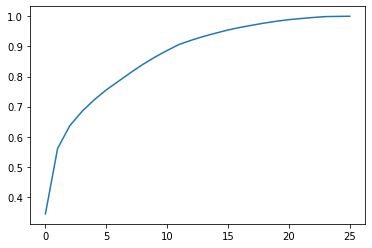

In [59]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

PCA component of 12 providing a 90% variance

In [60]:
pca=PCA(n_components=12)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

# Training the model on Knearest neighbour and Randomforest

In [61]:
knn=KNeighborsClassifier()

In [62]:
rfc=RandomForestClassifier(n_estimators=100,random_state=2)

In [63]:
clfs = {
    'Random Forest': rfc, 
    "KNeighbour": knn
}

In [64]:
def train_classifier(clf,X_train_trf,y_train,X_test_trf,y_test):
    clf.fit(X_train_trf,y_train)
    y_pred=clf.predict(X_test_trf)
    accuracy=accuracy_score(y_test,y_pred)
    precision=precision_score(y_test,y_pred)
    recall=recall_score(y_test,y_pred)
    f1_scores=f1_score(y_test,y_pred)
    
    return accuracy,precision,recall,f1_scores

In [65]:
accuracy_scores = []
precision_scores = []
recall_scores=[]
f1_scores=[]

for name,clf in clfs.items():
    
    current_accuracy,current_precision,current_recall,current_f1score = train_classifier(clf,X_train_trf,y_train,X_test_trf,y_test)
    
    print("For ",name)
    print("Accuracy - ",current_accuracy)
    print("Precision - ",current_precision)
    print("Recall - ",current_recall)
    print("F1-Score - ",current_f1score)
    
    accuracy_scores.append(current_accuracy)
    precision_scores.append(current_precision)
    recall_scores.append(current_recall)
    f1_scores.append(current_f1score)
  

For  Random Forest
Accuracy -  0.8098888888888889
Precision -  0.6022433132010354
Recall -  0.35831622176591377
F1-Score -  0.4493080141615707
For  KNeighbour
Accuracy -  0.797
Precision -  0.5448480355819125
Recall -  0.3773100616016427
F1-Score -  0.445859872611465


In [66]:
performance=pd.DataFrame({"Algorithm":clfs.keys(),"Accuracy":accuracy_scores,"Precision":precision_scores,"Recall":recall_scores,"F1-Score":f1_scores}).sort_values("Recall",ascending=False,ignore_index=True)

In [67]:
performance


,Algorithm,Accuracy,Precision,Recall,F1-Score
0,KNeighbour,0.797000,0.544848,0.377310,0.445860
1,Random Forest,0.809889,0.602243,0.358316,0.449308


	Random Forest seems to perform good

Hyperparameter tuning of Random Forest

In [68]:
parameters = {'max_depth' : [3,6,9,12],
              "criterion":["gini","entropy"],
             'n_estimators' : [50,100,200]}

# GridSearchCV

In [69]:
from sklearn.model_selection import GridSearchCV
gs = GridSearchCV(estimator = rfc, param_grid = parameters, 
                          cv = 5, n_jobs = -1, verbose = 2)

In [70]:
gs.fit(X_train_trf,y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=2), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 6, 9, 12],
                         'n_estimators': [50, 100, 200]},
             verbose=2)

In [71]:
gs.best_params_

{'criterion': 'entropy', 'max_depth': 12, 'n_estimators': 100}

In [72]:
 rfc_grid=RandomForestClassifier(criterion ='entropy', max_depth= 12, n_estimators= 200)

In [73]:
 train_classifier(rfc_grid,X_train_trf,y_train,X_test_trf,y_test)

(0.8151111111111111,
 0.6342155009451795,
 0.3444558521560575,
 0.4464404524284764)

Getting a accuracy of 81.7% and precision of 64% using GridSearchCV

# RandomizedSearchCV

In [74]:
from sklearn.model_selection import RandomizedSearchCV

In [75]:
parameters = {'max_depth' : [3,6,9,12],
              "criterion":["gini","entropy"],
             'n_estimators' : [50,100,200]}

In [76]:
rs= RandomizedSearchCV(rfc, parameters, cv = 5,n_jobs=-1)

In [77]:
rs.fit(X_train_trf,y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=2),
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [3, 6, 9, 12],
                                        'n_estimators': [50, 100, 200]})

In [78]:
rs.best_params_

{'n_estimators': 100, 'max_depth': 12, 'criterion': 'gini'}

In [79]:
 rfc_random=RandomForestClassifier(criterion ='gini', max_depth= 12, n_estimators= 100)

In [80]:
 train_classifier(rfc_random,X_train_trf,y_train,X_test_trf,y_test)

(0.8178888888888889,
 0.6423963133640553,
 0.3578028747433265,
 0.4596109462578305)

Getting a accuracy of 81.3% and precision of 62.5% using RandomSearchCV